## As part of our research, we were able to collect a recent bus stop dataset from LA Metro. I created maps to identify bus stops with shelter and bus stops without shelter for a spatial comparative analysis of two neighborhoods that are near each other are but vastly different in almost every way: income, car ownership, equity, and vulnerability. This will help in understanding 

In [99]:
# Importing the libraries.
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx
import os
import folium
from shapely.geometry import Point
import geopandas as gpd
import plotly.express as px


In [100]:
# Identifying the Metro data
file_path = 'Metro_BusStops_CityofLA.shp' 

In [101]:
# Reading the data
gdf = gpd.read_file(file_path)

In [102]:
#Checking things out 
print(gdf.head())

   Join_Count  TARGET_FID  Join_Cou_1  TARGET_F_1    F_        lat  \
0           1           1           1           0   4.0  34.050755   
1           1           2           1           1   6.0  34.050622   
2           1           3           1           2  16.0  34.051763   
3           1           4           1           3  19.0  34.052020   
4           1           5           1           4  20.0  34.052020   

          lng                                  uuid shelter_pr  Shelter  \
0 -118.241121  5b690223-c44e-4055-e89c-524e97851b5d        Yes        1   
1 -118.240582  13347bdd-bb79-4414-9334-b3948b2ad0b6         No        0   
2 -118.242715  cb0990ec-6d9f-481b-ea6a-9c2038f7f745         No        0   
3 -118.243174  5c112356-3d9a-4f94-d86b-8139e39dd903         No        0   
4 -118.243174  5c112356-3d9a-4f94-d86b-8139e39dd903         No        0   

   CountStop  OBJECTID_1 DISTRICT  SB535  RASTERVALU  \
0          1           2        1      0    101.4750   
1          1    

In [103]:
print(gdf.info())

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 6315 entries, 0 to 6314
Data columns (total 16 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   Join_Count  6315 non-null   int64   
 1   TARGET_FID  6315 non-null   int64   
 2   Join_Cou_1  6315 non-null   int64   
 3   TARGET_F_1  6315 non-null   int64   
 4   F_          6315 non-null   float64 
 5   lat         6315 non-null   float64 
 6   lng         6315 non-null   float64 
 7   uuid        6315 non-null   object  
 8   shelter_pr  6315 non-null   object  
 9   Shelter     6315 non-null   int64   
 10  CountStop   6315 non-null   int64   
 11  OBJECTID_1  6315 non-null   int64   
 12  DISTRICT    6315 non-null   object  
 13  SB535       6315 non-null   int64   
 14  RASTERVALU  6315 non-null   float64 
 15  geometry    6315 non-null   geometry
dtypes: float64(4), geometry(1), int64(8), object(3)
memory usage: 789.5+ KB
None


In [104]:
print(gdf.columns)

Index(['Join_Count', 'TARGET_FID', 'Join_Cou_1', 'TARGET_F_1', 'F_', 'lat',
       'lng', 'uuid', 'shelter_pr', 'Shelter', 'CountStop', 'OBJECTID_1',
       'DISTRICT', 'SB535', 'RASTERVALU', 'geometry'],
      dtype='object')


<Axes: >

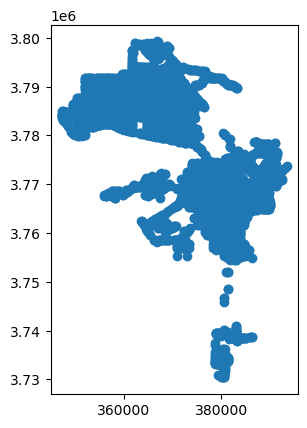

In [105]:
#Playing around with the data
gdf.plot()

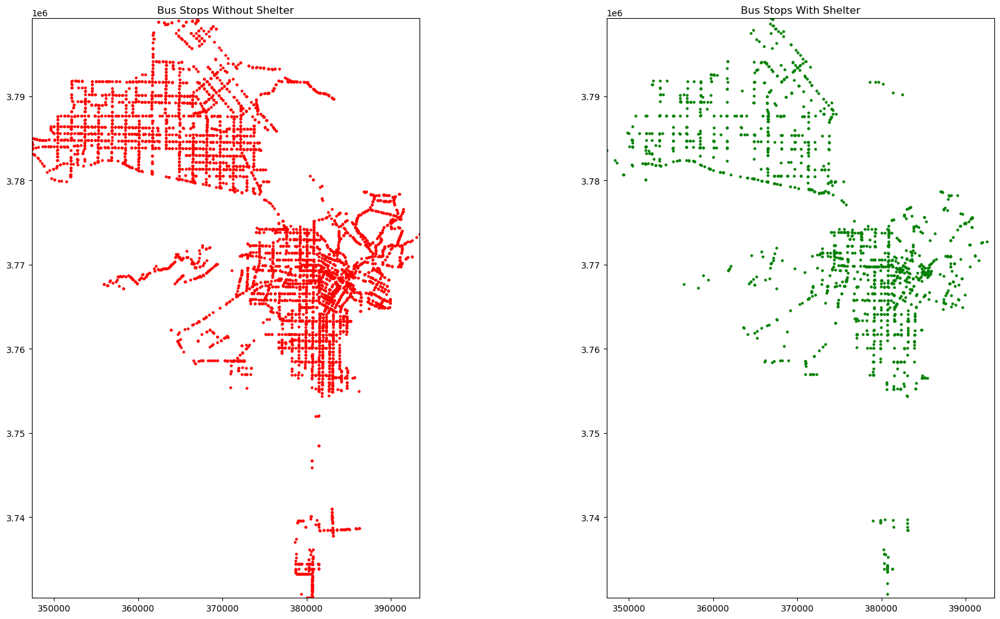

In [106]:
#Creating a figure with two subplots and setting limits to the bounds.

fig, axes = plt.subplots(1, 2, figsize=(20, 10))

bounds = gdf.total_bounds  # returns (minx, miny, maxx, maxy)
xlim = (bounds[0], bounds[2])
ylim = (bounds[1], bounds[3])

no_shelter = gdf[gdf['Shelter'] == 0]
no_shelter.plot(ax=axes[0], color='red', markersize=5)
axes[0].set_title('Bus Stops Without Shelter')
axes[0].set_xlim(xlim)
axes[0].set_ylim(ylim)

with_shelter = gdf[gdf['Shelter'] == 1]
with_shelter.plot(ax=axes[1], color='green', markersize=5)
axes[1].set_title('Bus Stops With Shelter')
axes[1].set_xlim(xlim)
axes[1].set_ylim(ylim)

plt.tight_layout()
plt.show()

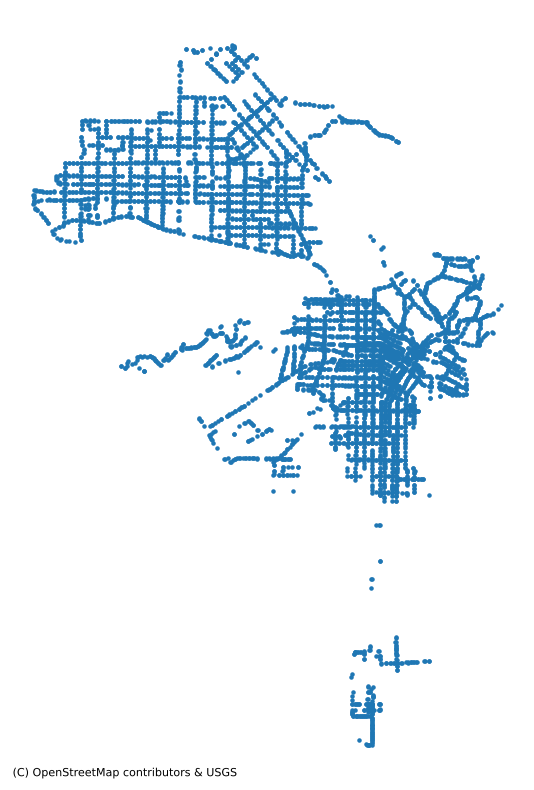

In [107]:
# Creating another map. I wanted to visualize the entire City.

fig, ax = plt.subplots(figsize=(10, 10))
gdf.plot(ax=ax, markersize=5)
ctx.add_basemap(ax, source=ctx.providers.MtbMap) 
ax.set_axis_off()  
plt.show()

In [108]:
# Filtering and separating the GeoDataFrame based on bus stops with shelter and bus stops without shelter
gdf_shelter = gdf[gdf['Shelter'] == 1]
gdf_no_shelter = gdf[gdf['Shelter'] == 0]

In [109]:
# A folium map because who doesn't love a folium map!

m = folium.Map(location=[gdf['lat'].mean(), gdf['lng'].mean()], zoom_start=12)

for _, row in gdf_shelter.iterrows():
    folium.Marker(
        location=[row['lat'], row['lng']],
        popup='Shelter',
        icon=folium.Icon(color='green', icon='home')
    ).add_to(m)

for _, row in gdf_no_shelter.iterrows():
    folium.Marker(
        location=[row['lat'], row['lng']],
        popup='No Shelter',
        icon=folium.Icon(color='red', icon='info-sign')
    ).add_to(m)

folium.LayerControl().add_to(m)

m

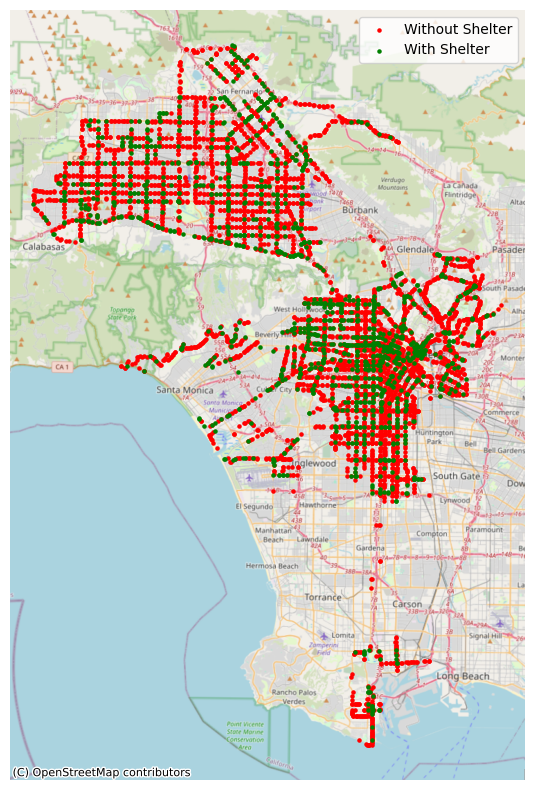

In [110]:
# Playing around with different visualizations, it's interesting to see how certain areas have more shelters than others!

fig, ax = plt.subplots(figsize=(10, 10))

gdf_no_shelter.plot(ax=ax, color='red', markersize=5, label='Without Shelter')

gdf_shelter.plot(ax=ax, color='green', markersize=5, label='With Shelter')

ctx.add_basemap(ax, crs=gdf.crs.to_string(), source=ctx.providers.OpenStreetMap.Mapnik)

ax.set_axis_off()

ax.legend()

plt.show()

In [111]:
# Reading the file

neighborhoods_gdf = gpd.read_file('LA_Times_Neighborhood_Boundaries.geojson')

In [112]:
# Converting the GeoDataFrame's coordinate reference system (CRS) to match that of the neighborhoods data -- this took forever despite being such a short line of code!

gdf = gdf.to_crs(neighborhoods_gdf.crs)

In [113]:
# A spatial join between the GeoDataFrame of locations and neighborhoods, keeping only what intersects

gpd.sjoin(gdf, neighborhoods_gdf, how="inner", predicate='intersects')

,Join_Count,TARGET_FID,Join_Cou_1,TARGET_F_1,F_,lat,lng,uuid,shelter_pr,Shelter,CountStop,OBJECTID_1,DISTRICT,SB535,RASTERVALU,geometry,index_right,OBJECTID,name
0,1,1,1,0,4.0,34.050755,-118.241121,5b690223-c44e-4055-e89c-524e97851b5d,Yes,1,1,2,1,0,101.4750,POINT (-118.24112 34.05075),23,24,Downtown
1,1,2,1,1,6.0,34.050622,-118.240582,13347bdd-bb79-4414-9334-b3948b2ad0b6,No,0,1,2,1,1,101.5170,POINT (-118.24058 34.05062),23,24,Downtown
2,1,3,1,2,16.0,34.051763,-118.242715,cb0990ec-6d9f-481b-ea6a-9c2038f7f745,No,0,1,2,1,0,94.6687,POINT (-118.24271 34.05176),23,24,Downtown
3,1,4,1,3,19.0,34.052020,-118.243174,5c112356-3d9a-4f94-d86b-8139e39dd903,No,0,1,2,1,0,95.0533,POINT (-118.24317 34.05202),23,24,Downtown
4,1,5,1,4,20.0,34.052020,-118.243174,5c112356-3d9a-4f94-d86b-8139e39dd903,No,0,1,2,1,0,95.0533,POINT (-118.24317 34.05202),23,24,Downtown
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6310,1,4341,1,4340,6180.0,34.137726,-118.187787,5903d0af-2618-44d4-b2c9-539c393a7232,No,0,1,2,1,0,99.2845,POINT (-118.18779 34.13773),24,25,Eagle Rock
6311,1,4359,1,4358,6210.0,34.138128,-118.187893,266ec2d8-2ff1-4014-b76b-6784611ec703,No,0,1,2,1,0,98.6880,POINT (-118.18789 34.13813),24,25,Eagle Rock
6312,1,4371,1,4370,6235.0,34.138127,-118.187108,3348d22a-a79f-4835-fe80-df0a85ac2ebd,No,0,1,2,1,0,97.3916,POINT (-118.18711 34.13813),24,25,Eagle Rock
6313,1,4545,1,4544,6535.0,34.140545,-118.182667,331669bc-e66a-47b2-941a-2a185a6c6169,No,0,1,2,1,0,96.9136,POINT (-118.18267 34.14055),24,25,Eagle Rock


In [114]:
# Reading the neighborhood boundaries
neighborhoods_gdf = gpd.read_file('LA_Times_Neighborhood_Boundaries.geojson')

# Filtering for Silver Lake and Echo Park, and Westlake neighborhoods 
silver_lake_echo_park = neighborhoods_gdf[neighborhoods_gdf['name'].isin(['Silver Lake', 'Echo Park'])]
westlake = neighborhoods_gdf[neighborhoods_gdf['name'] == 'Westlake']

# Reading and defining the Metro stops data
bus_stops_gdf = gpd.read_file('Metro_BusStops_CityofLA.shp')

# Make sure bus stops are in the same CRS as the neighborhoods
if neighborhoods_gdf.crs is not None:
    bus_stops_gdf = bus_stops_gdf.to_crs(neighborhoods_gdf.crs)
else:
    raise ValueError("The CRS for neighborhoods_gdf is not defined.")

# Spatial join to associate bus stops with neighborhoods
stops_with_neighborhoods = gpd.sjoin(bus_stops_gdf, neighborhoods_gdf, how="left", predicate='intersects')

# Filtering bus stops for Silver Lake/Echo Park & Westlake neighborhoods
silver_lake_echo_park_stops = stops_with_neighborhoods[stops_with_neighborhoods['name'].isin(['Silver Lake', 'Echo Park'])]
westlake_stops = stops_with_neighborhoods[stops_with_neighborhoods['name'] == 'Westlake']


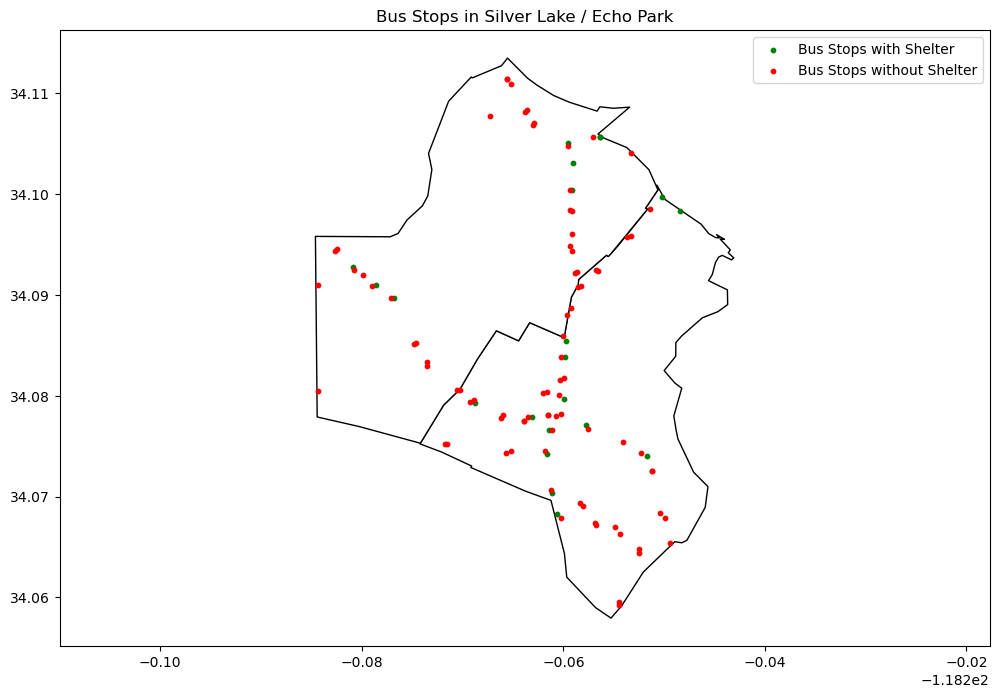

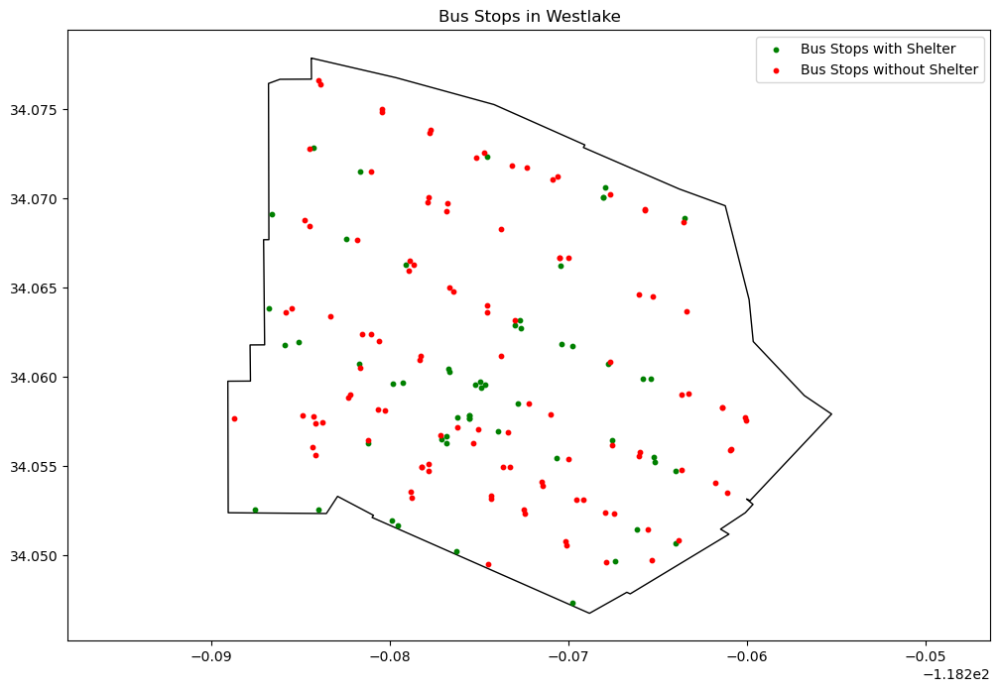

In [115]:
# Visualizing the data for both neighborhoods
def plot_neighborhood_stops(neighborhood_gdf, stops_gdf, title):
    fig, ax = plt.subplots(figsize=(12, 8))
    neighborhood_gdf.plot(ax=ax, color='white', edgecolor='black')
    stops_gdf[stops_gdf['Shelter'] == 1].plot(ax=ax, color='green', markersize=10, label='Bus Stops with Shelter')
    stops_gdf[stops_gdf['Shelter'] == 0].plot(ax=ax, color='red', markersize=10, label='Bus Stops without Shelter')
    ax.set_title(title)
    ax.legend()
    plt.axis('equal')
    plt.show()

plot_neighborhood_stops(silver_lake_echo_park, silver_lake_echo_park_stops, 'Bus Stops in Silver Lake / Echo Park')

plot_neighborhood_stops(westlake, westlake_stops, 'Bus Stops in Westlake')



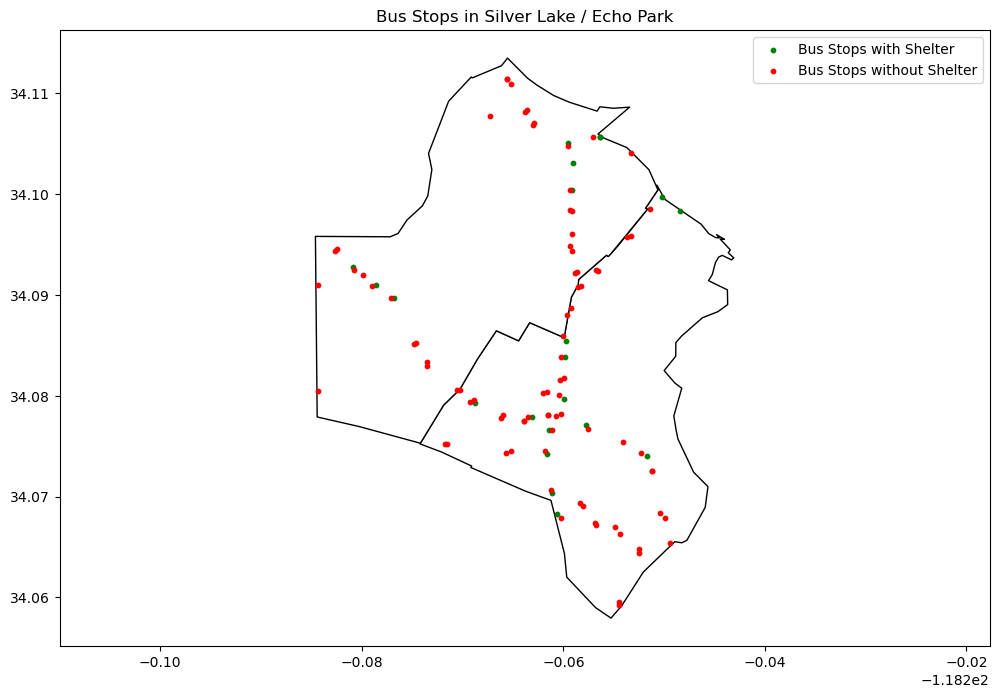

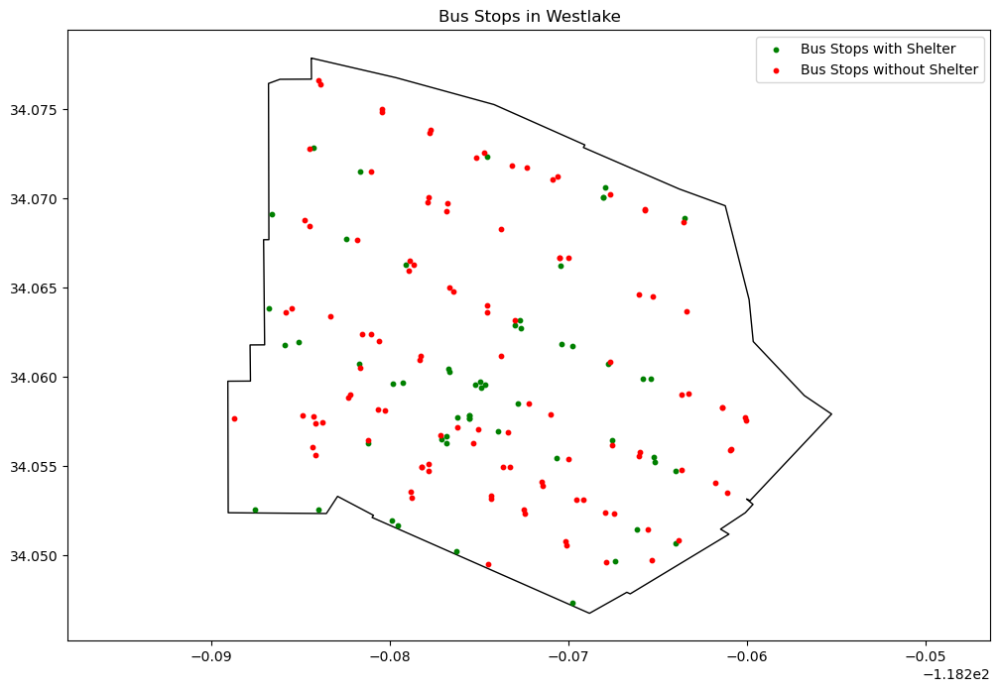

In [116]:
# Visualizing the data for both neighborhoods
def plot_neighborhood_stops(neighborhood_gdf, stops_gdf, title):
    fig, ax = plt.subplots(figsize=(12, 8))
    neighborhood_gdf.plot(ax=ax, color='white', edgecolor='black')
    stops_gdf[stops_gdf['Shelter'] == 1].plot(ax=ax, color='green', markersize=10, label='Bus Stops with Shelter')
    stops_gdf[stops_gdf['Shelter'] == 0].plot(ax=ax, color='red', markersize=10, label='Bus Stops without Shelter')
    ax.set_title(title)
    ax.legend()
    plt.axis('equal')
    plt.show()

plot_neighborhood_stops(silver_lake_echo_park, silver_lake_echo_park_stops, 'Bus Stops in Silver Lake / Echo Park')

plot_neighborhood_stops(westlake, westlake_stops, 'Bus Stops in Westlake')



In [122]:
# Taking a look at the numbers
silver_lake_echo_park_shade_count = silver_lake_echo_park_stops['Shelter'].sum()
silver_lake_echo_park_no_shade_count = (silver_lake_echo_park_stops['Shelter'] == 0).sum()

westlake_shade_count = westlake_stops['Shelter'].sum()
westlake_no_shade_count = (westlake_stops['Shelter'] == 0).sum()

print(f"Silver Lake/Echo Park - With Shade: {silver_lake_echo_park_shade_count}, Without Shade: {silver_lake_echo_park_no_shade_count}")
print(f"Westlake - With Shade: {westlake_shade_count}, Without Shade: {westlake_no_shade_count}")


Silver Lake/Echo Park - With Shade: 21, Without Shade: 86
Westlake - With Shade: 56, Without Shade: 110


In [118]:
# Creating a Folium map for a each neighborhood. It projects the neighborhood to EPSG:3857, calculates its centroid, and uses this to center the map. 
#It then adds the neighborhood's boundaries and bus stops to the map, color-coding the stops based on shelter availability. 
#Also created custom HTML for a header and a legend detailing the bus stop markers.

def create_neighborhood_map(neighborhood, bus_stops, neighborhood_name):
    projected_neighborhood = neighborhood.to_crs(epsg=3857)
    
    centroid_x = projected_neighborhood.geometry.centroid.x.mean()
    centroid_y = projected_neighborhood.geometry.centroid.y.mean()
    
    centroid = gpd.GeoSeries([Point(centroid_x, centroid_y)], crs='EPSG:3857').to_crs(epsg=4326)
    
    m = folium.Map(location=[centroid.geometry.y.iloc[0], centroid.geometry.x.iloc[0]], zoom_start=15.2, tiles='OpenStreetMap')
   
    folium.GeoJson(neighborhood.geometry.to_crs(epsg=4326), name=neighborhood_name).add_to(m)
  
    for _, row in bus_stops.iterrows():
        color = 'green' if row['Shelter'] == 1 else 'red'
        folium.CircleMarker(
            location=(row.geometry.y, row.geometry.x),
            radius=5,
            color=color,
            fill=True,
            fill_color=color,
            popup=f"Shelter: {'Yes' if row['Shelter'] == 1 else 'No'}"
        ).add_to(m)

    
    header_html = """
    <div style="position: fixed; 
                top: 10px; 
                left: 50px; 
                width: 310px; 
                z-index:9999; 
                font-size:24px; 
                background-color: rgba(255, 255, 255, 0.8); 
                padding: 10px; 
                border-radius: 10px;">
    <h2 style="margin:0; padding:0;">Westlake, Los Angeles</h2>
    </div>
    """
    m.get_root().html.add_child(folium.Element(header_html))

    legend_html = """
    <div style="position: fixed; 
                bottom: 50px; 
                left: 50px; 
                width: 180px; 
                height: auto; 
                background-color: white; 
                border-radius: 5px;
                padding: 10px;
                box-shadow: 0 0 15px rgba(0, 0, 0, 0.2);
                z-index:9999;">
    <b>Bus Stop Legend</b> <br>
    <i class="fa fa-circle fa-1x" style="color:green"></i> With Shelter <br>
    <i class="fa fa-circle fa-1x" style="color:red"></i> Without Shelter <br>
    Total with shelter: 56 <br>
    Total without shelter: 110
    </div>
    """
    m.get_root().html.add_child(folium.Element(legend_html))
    
    return m

westlake_map = create_neighborhood_map(westlake_neighborhood, westlake_stops, 'Westlake')

westlake_map


In [123]:
def create_neighborhood_map(neighborhood, bus_stops, neighborhood_name):
    projected_neighborhood = neighborhood.to_crs(epsg=3857)
    
    centroid_x = projected_neighborhood.geometry.centroid.x.mean()
    centroid_y = projected_neighborhood.geometry.centroid.y.mean()
    
    centroid = gpd.GeoSeries([Point(centroid_x, centroid_y)], crs='EPSG:3857').to_crs(epsg=4326)
    
    m = folium.Map(location=[centroid.geometry.y.iloc[0], centroid.geometry.x.iloc[0]], zoom_start=15.2, tiles='OpenStreetMap')
   
    folium.GeoJson(neighborhood.geometry.to_crs(epsg=4326), name=neighborhood_name).add_to(m)
  
    for _, row in bus_stops.iterrows():
        color = 'green' if row['Shelter'] == 1 else 'red'
        folium.CircleMarker(
            location=(row.geometry.y, row.geometry.x),
            radius=5,
            color=color,
            fill=True,
            fill_color=color,
            popup=f"Shelter: {'Yes' if row['Shelter'] == 1 else 'No'}"
        ).add_to(m)

    
    header_html = """
    <div style="position: fixed; 
                top: 10px; 
                left: 50px; 
                width: 310px; 
                z-index:9999; 
                font-size:24px; 
                background-color: rgba(255, 255, 255, 0.8); 
                padding: 10px; 
                border-radius: 10px;">
    <h2 style="margin:0; padding:0;">Silverlake/Echo Park</h2>
    </div>
    """
    m.get_root().html.add_child(folium.Element(header_html))

    legend_html = """
    <div style="position: fixed; 
                bottom: 50px; 
                left: 50px; 
                width: 180px; 
                height: auto; 
                background-color: white; 
                border-radius: 5px;
                padding: 10px;
                box-shadow: 0 0 15px rgba(0, 0, 0, 0.2);
                z-index:9999;">
    <b>Bus Stop Legend</b> <br>
    <i class="fa fa-circle fa-1x" style="color:green"></i> With Shelter <br>
    <i class="fa fa-circle fa-1x" style="color:red"></i> Without Shelter <br>
    Total with shelter: 21 <br>
    Total without shelter: 86
    </div>
    """
    m.get_root().html.add_child(folium.Element(legend_html))
    
    return m

silverlake_echo_park_map = create_neighborhood_map(silver_lake_echo_park, silver_lake_echo_park_stops, ['Silver Lake', 'Echo Park'])

silverlake_echo_park_map



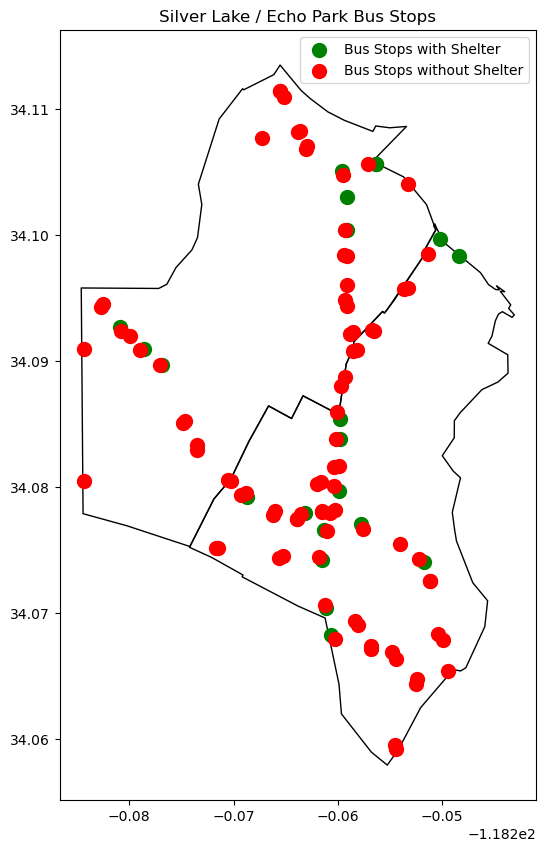

In [124]:
# Creating a 10x10 inch matplotlib plot. Plotted the boundaries of the Silver Lake and Echo Park neighborhoods with no fill
# and black border. Overlayed bus stops on the map, using green markers for those with shelters and red for those without. Did not realize it would look so Christmasy!
# Each marker's size is set to 100 for visibility. 

fig, ax = plt.subplots(figsize=(10, 10))
silver_lake_echo_park_neighborhood.plot(ax=ax, color='none', edgecolor='black')
silver_lake_echo_park_stops[silver_lake_echo_park_stops['Shelter'] == 1].plot(ax=ax, marker='o', color='green', markersize=100, label='Bus Stops with Shelter')
silver_lake_echo_park_stops[silver_lake_echo_park_stops['Shelter'] == 0].plot(ax=ax, marker='o', color='red', markersize=100, label='Bus Stops without Shelter')
ax.set_title('Silver Lake / Echo Park Bus Stops')
ax.legend()
plt.show()

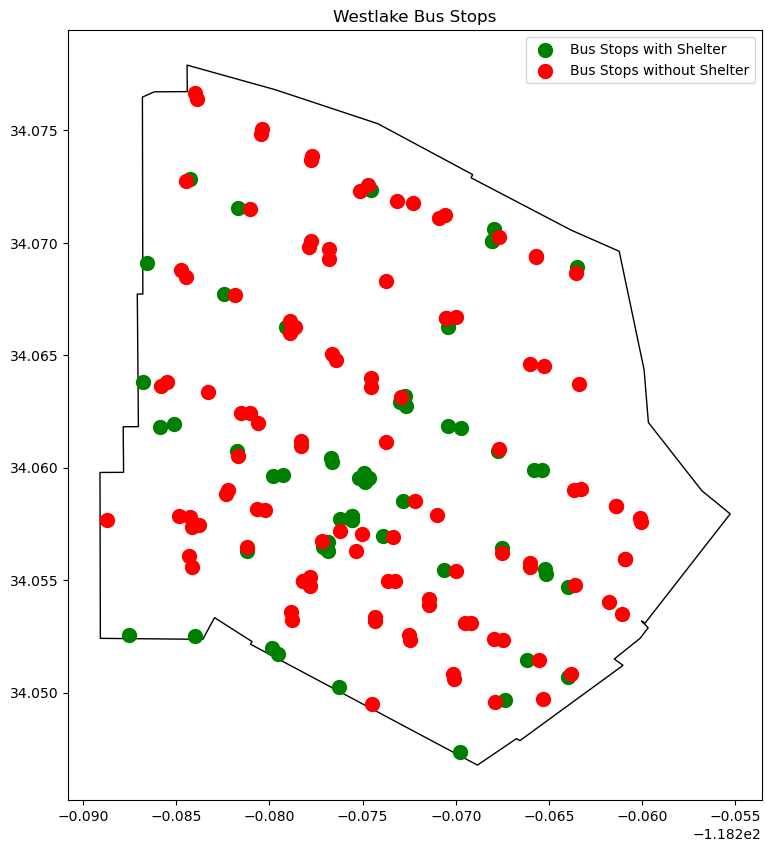

In [125]:
# Did the same for Westlake

fig, ax = plt.subplots(figsize=(10, 10))
westlake_neighborhood.plot(ax=ax, color='none', edgecolor='black')
westlake_stops[westlake_stops['Shelter'] == 1].plot(ax=ax, marker='o', color='green', markersize=100, label='Bus Stops with Shelter')
westlake_stops[westlake_stops['Shelter'] == 0].plot(ax=ax, marker='o', color='red', markersize=100, label='Bus Stops without Shelter')
ax.set_title('Westlake Bus Stops')
ax.legend()
plt.show()

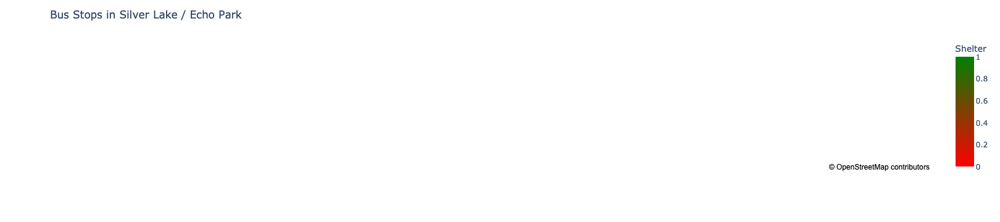

In [126]:
# Created a plotly map looking at lat/lon

def create_plotly_map(neighborhood_gdf, stops_gdf, neighborhood_name):
    fig = px.scatter_mapbox(stops_gdf,
                            lat=stops_gdf.geometry.y,
                            lon=stops_gdf.geometry.x,
                            color="Shelter",
                            color_continuous_scale=["red", "green"],
                            size_max=15,
                            zoom=12,
                            mapbox_style="open-street-map")
    fig.update_layout(title_text=f"Bus Stops in {neighborhood_name}")
    fig.show()

create_plotly_map(silver_lake_echo_park_neighborhood, silver_lake_echo_park_stops, 'Silver Lake / Echo Park')

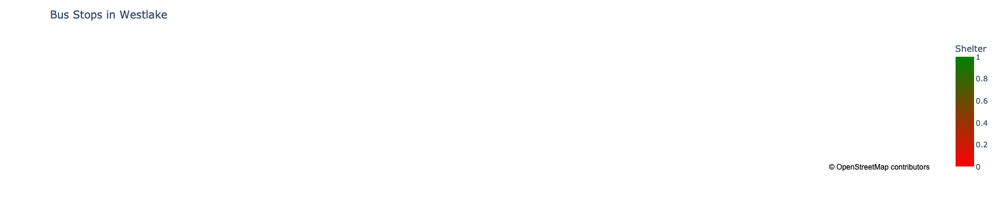

In [127]:
# Did the same for Westlake

def create_plotly_map(neighborhood_gdf, stops_gdf, neighborhood_name):
    fig = px.scatter_mapbox(stops_gdf,
                            lat=stops_gdf.geometry.y,
                            lon=stops_gdf.geometry.x,
                            color="Shelter",
                            color_continuous_scale=["red", "green"],
                            size_max=15,
                            zoom=12,
                            mapbox_style="open-street-map")
    fig.update_layout(title_text=f"Bus Stops in {neighborhood_name}")
    fig.show()

create_plotly_map(westlake_neighborhood, westlake_stops, 'Westlake')

## Understanding shade equity entails two key parts: understanding shade infrastructure and heat-health burdens. For my task in our group projects, we were able to understand the shade infrastructure available in both neighborhoods. The next step is to overlay this data with tree canopy, thereby having a better understanding of the shade infrastructure for both neighborhoods.